In [ ]:
!pip install tensorflow
!pip install kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d 'soumikrakshit/anime-faces'
!unzip anime-faces.zip

deployment

Streaming output truncated to the last 5000 lines.
  inflating: data/data/5499.png      
  inflating: data/data/55.png        
  inflating: data/data/550.png       
  inflating: data/data/5500.png      
  inflating: data/data/5501.png      
  inflating: data/data/5502.png      
  inflating: data/data/5503.png      
  inflating: data/data/5504.png      
  inflating: data/data/5505.png      
  inflating: data/data/5506.png      
  inflating: data/data/5507.png      
  inflating: data/data/5508.png      
  inflating: data/data/5509.png      
  inflating: data/data/551.png       
  inflating: data/data/5510.png      
  inflating: data/data/5511.png      
  inflating: data/data/5512.png      
  inflating: data/data/5513.png      
  inflating: data/data/5514.png      
  inflating: data/data/5515.png      
  inflating: data/data/5516.png      
  inflating: data/data/5517.png      
  inflating: data/data/5518.png      
  inflating: data/data/5519.png      
  inflating: data/data/552.png       

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Reshape, Dropout, BatchNormalization, ReLU, LeakyReLU, Conv2D, Conv2DTranspose
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import Callback
from sklearn.model_selection import train_test_split

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")


In [2]:
# Parameters
img_width, img_height = 64, 64
batch_size = 64
input_dim = 100  # Latent space dimension
epochs = 50
lr_g = 0.0003
lr_d = 0.0001
beta = 0.5

# Paths for dataset and saving outputs
dataset_dir = "./data"  # Update with your dataset directory
save_dir = "./generated_images/"  # Save generated images
weights_save_dir = "./model_weights/"  # Save model weights
model_save_dir = "./saved_models/"  # Save complete models
log_dir = "./logs"  # Directory for TensorBoard logs

# Ensure save directories exist
for directory in [save_dir, weights_save_dir, model_save_dir, log_dir]:
    os.makedirs(directory, exist_ok=True)


In [3]:
# Function to visualize dataset samples
def visualize_dataset(dataset):
    plt.figure(figsize=(15, 5))
    for i in range(5):
        plt.subplot(1, 5, i + 1)
        plt.imshow(dataset[i])
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(f"{save_dir}/dataset_samples.png")
    plt.close()

# Function to plot model convergence
def plot_convergence(history):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history["d_loss"], label="Discriminator Loss")
    plt.title("Discriminator Loss")
    plt.subplot(1, 2, 2)
    plt.plot(history.history["g_loss"], label="Generator Loss")
    plt.title("Generator Loss")
    plt.tight_layout()
    plt.savefig(f"{save_dir}/convergence_plot.png")
    plt.close()


In [4]:
# Callback to save weights
class WeightSavingCallback(Callback):
    def __init__(self, save_dir, prefix="dcgan"):
        super().__init__()
        self.save_dir = save_dir
        self.prefix = prefix

    def on_epoch_end(self, epoch, logs=None):
        epoch_str = f"{epoch + 1:03d}"
        generator_path = os.path.join(self.save_dir, f"{self.prefix}_generator_weights_epoch_{epoch_str}.weights.h5")
        discriminator_path = os.path.join(self.save_dir, f"{self.prefix}_discriminator_weights_epoch_{epoch_str}.weights.h5")
        self.model.generator.save_weights(generator_path)
        self.model.discriminator.save_weights(discriminator_path)
        print(f"Saved weights: Generator to {generator_path}, Discriminator to {discriminator_path}")


In [5]:
# Function to load images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if img_path.endswith((".png", ".jpg", ".jpeg")):
            img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
            img = tf.keras.preprocessing.image.img_to_array(img) / 255.0
            images.append(img)
    return np.array(images)

# Load dataset
dataset = load_images_from_folder(dataset_dir, target_size=(img_width, img_height))
print(f"Loaded {len(dataset)} images.")
visualize_dataset(dataset)

# Convert dataset to TensorFlow Dataset
train_dataset = tf.data.Dataset.from_tensor_slices(dataset).shuffle(buffer_size=1024).batch(batch_size)


Loaded 21551 images.


In [6]:
# Generator Model
def Generator_Model():
    model = Sequential([
        Dense(8 * 8 * 512, input_dim=input_dim),
        ReLU(),
        Reshape((8, 8, 512)),
        Conv2DTranspose(256, (4, 4), strides=(2, 2), padding="same"),
        ReLU(),
        Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        ReLU(),
        Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"),
        ReLU(),
        Conv2D(3, (4, 4), padding="same", activation="sigmoid")
    ])
    return model

# Discriminator Model
def Discriminator_Model():
    model = Sequential([
        Conv2D(64, (4, 4), strides=(2, 2), padding="same", input_shape=(img_width, img_height, 3)),
        LeakyReLU(0.2),
        Conv2D(128, (4, 4), strides=(2, 2), padding="same"),
        LeakyReLU(0.2),
        Conv2D(256, (4, 4), strides=(2, 2), padding="same"),
        LeakyReLU(0.2),
        Flatten(),
        Dense(1, activation="sigmoid")
    ])
    return model


In [7]:
# Callback to monitor and save generated images
class DCGANMonitor(Callback):
    def __init__(self, num_imgs=25, latent_dim=input_dim, save_dir=save_dir):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        self.save_dir = save_dir
        self.noise = tf.random.normal([num_imgs, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 10 == 0:
            generated_images = self.model.generator(self.noise, training=False)
            generated_images = (generated_images * 255).numpy().astype("uint8")
            plt.figure(figsize=(10, 10))
            for i in range(self.num_imgs):
                plt.subplot(5, 5, i + 1)
                plt.imshow(generated_images[i])
                plt.axis("off")
            plt.savefig(f"{self.save_dir}/generated_epoch_{epoch + 1}.png")
            plt.close()


In [8]:
# DCGAN Model Definition
class DCGAN(tf.keras.Model):
    def __init__(self, generator, discriminator, latent_dim=input_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")
        self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super().compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Train discriminator
        with tf.GradientTape() as tape:
            real_labels = tf.ones((batch_size, 1)) * 0.9
            fake_labels = tf.zeros((batch_size, 1))
            pred_real = self.discriminator(real_images, training=True)
            d_loss_real = self.loss_fn(real_labels, pred_real)

            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            d_loss = (d_loss_real + d_loss_fake) / 2

        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))

        # Train generator
        misleading_labels = tf.ones((batch_size, 1))
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            g_loss = self.loss_fn(misleading_labels, pred_fake)

        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}


In [15]:
def save_complete_models(generator, discriminator, dcgan, save_dir):
    """
    Save complete generator, discriminator, and DCGAN models

    Args:
        generator (keras.Model): Trained generator model
        discriminator (keras.Model): Trained discriminator model
        dcgan (keras.Model): Trained DCGAN model
        save_dir (str): Directory to save models
    """
    # Ensure save directory exists
    os.makedirs(save_dir, exist_ok=True)

    # Save generator model
    generator_path = os.path.join(save_dir, "complete_generator2_model.h5")
    generator.save(generator_path)
    print(f"Complete generator model saved to {generator_path}")

    # Save discriminator model
    discriminator_path = os.path.join(save_dir, "complete_discriminator2_model.h5")
    discriminator.save(discriminator_path)
    print(f"Complete discriminator model saved to {discriminator_path}")

    # Save the entire DCGAN model
    dcgan_path = os.path.join(save_dir, "complete_dcgan2_model.h5")
    dcgan.save(dcgan_path)
    print(f"Complete DCGAN model saved to {dcgan_path}")

In [9]:
# Initialize Generator and Discriminator
generator = Generator_Model()
discriminator = Discriminator_Model()

# Initialize TensorBoard callback
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Initialize and compile DCGAN model
dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim=input_dim)
dcgan.compile(
    g_optimizer=Adam(learning_rate=lr_g, beta_1=beta),
    d_optimizer=Adam(learning_rate=lr_d, beta_1=beta),
    loss_fn=BinaryCrossentropy(),
)


In [10]:
# Train the DCGAN model
history = dcgan.fit(
    train_dataset,
    epochs=epochs,
    callbacks=[
        DCGANMonitor(),
        WeightSavingCallback(save_dir=weights_save_dir),
        tensorboard_callback,
    ]
)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - d_loss: 0.6520 - g_loss: 0.7871Saved weights: Generator to ./model_weights/dcgan_generator_weights_epoch_001.weights.h5, Discriminator to ./model_weights/dcgan_discriminator_weights_epoch_001.weights.h5
337/337 ━━━━━━━━━━━━━━━━━━━━ 63s 147ms/step - d_loss: 0.6520 - g_loss: 0.7873
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 0.6905 - g_loss: 0.8352Saved weights: Generator to ./model_weights/dcgan_generator_weights_epoch_002.weights.h5, Discriminator to ./model_weights/dcgan_discriminator_weights_epoch_002.weights.h5
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - d_loss: 0.6905 - g_loss: 0.8352
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 0.6797 - g_loss: 0.8657Saved weights: Generator to ./model_weights/dcgan_generator_weights_epoch_003.weights.h5, Discriminator to ./model_weights/dcgan_discriminator_weights_epoch_003.weights.h5
337/337 ━━━━━━━━━━━━━━━━━━━━ 82s 121ms/step - d_loss: 0.6797 - g_lo

# Use this code if you want to Continue Training

In [ ]:
# Load the saved weights

latest_weight_no = epochs

print(f"Loading weights from epoch {latest_weight_no}")

dcgan.generator.load_weights(os.path.join(weights_save_dir, 'dcgan_generator_weights_epoch_0'+str(latest_weight_no)+'.weights.h5'))
dcgan.discriminator.load_weights(os.path.join(weights_save_dir, 'dcgan_discriminator_weights_epoch_0'+str(latest_weight_no)+'.weights.h5'))

# Update the total number of epochs
total_epochs = epochs + 10

# Continue training the DCGAN model
history = dcgan.fit(
    train_dataset,
    epochs=total_epochs,
    initial_epoch=epochs,
    callbacks=[
        DCGANMonitor(),
        WeightSavingCallback(save_dir=weights_save_dir),
        tensorboard_callback,
    ]
)

epochs=total_epochs

Loading weights from epoch 80
Epoch 81/90
337/337 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: 0.6799 - g_loss: 0.8540Saved weights: Generator to ./model_weights/dcgan_generator_weights_epoch_081.weights.h5, Discriminator to ./model_weights/dcgan_discriminator_weights_epoch_081.weights.h5
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - d_loss: 0.6799 - g_loss: 0.8540
Epoch 82/90
337/337 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: 0.6814 - g_loss: 0.8537Saved weights: Generator to ./model_weights/dcgan_generator_weights_epoch_082.weights.h5, Discriminator to ./model_weights/dcgan_discriminator_weights_epoch_082.weights.h5
337/337 ━━━━━━━━━━━━━━━━━━━━ 81s 120ms/step - d_loss: 0.6814 - g_loss: 0.8537
Epoch 83/90
337/337 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: 0.6788 - g_loss: 0.8521Saved weights: Generator to ./model_weights/dcgan_generator_weights_epoch_083.weights.h5, Discriminator to ./model_weights/dcgan_discriminator_weights_epoch_083.weights.h5
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 1

In [30]:
save_complete_models(generator, discriminator, dcgan, model_save_dir)


Complete generator model saved to ./saved_models/complete_generator2_model.h5
Complete discriminator model saved to ./saved_models/complete_discriminator2_model.h5
Complete DCGAN model saved to ./saved_models/complete_dcgan2_model.h5


In [31]:
import numpy as np
from scipy import linalg
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
import tensorflow.keras.backend as K

def calculate_metrics(generator, real_dataset, batch_size=32, n_samples=1000):
    """Calculate FID and IS scores with improved numerical stability"""

    # Initialize InceptionV3
    inception_model = InceptionV3(include_top=True, weights='imagenet')

    def get_features(images):
        # Ensure images are in [-1, 1] range
        images = tf.clip_by_value(images, 0.0, 1.0)
        images = tf.image.resize(images, (299, 299))
        images = preprocess_input(images * 255.0)  # Scale to [0,255] before preprocessing
        return inception_model.predict(images, batch_size=batch_size)

    # Generate images
    noise = tf.random.normal([n_samples, input_dim])
    generated_images = []

    # Generate images in batches
    for i in range(0, n_samples, batch_size):
        batch_noise = noise[i:i+batch_size]
        batch_images = generator(batch_noise, training=False)
        generated_images.append(batch_images)

    generated_images = tf.concat(generated_images, axis=0)

    # Get real images
    real_images = []
    for batch in real_dataset.take(n_samples // batch_size):
        real_images.append(batch)
    real_images = tf.concat(real_images, axis=0)[:n_samples]

    # Get inception features
    real_features = get_features(real_images)
    fake_features = get_features(generated_images)

    # Calculate FID
    mu1, sigma1 = np.mean(real_features, axis=0), np.cov(real_features, rowvar=False)
    mu2, sigma2 = np.mean(fake_features, axis=0), np.cov(fake_features, rowvar=False)

    ssdiff = np.sum((mu1 - mu2) ** 2)
    covmean = linalg.sqrtm(sigma1.dot(sigma2))

    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

    # Calculate IS with numerical stability
    def softmax(x):
        e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
        return e_x / np.sum(e_x, axis=1, keepdims=True)

    preds = softmax(fake_features)

    # Split predictions into groups
    n_split = 10
    scores = []
    for i in range(n_split):
        part = preds[(i * len(preds) // n_split):((i + 1) * len(preds) // n_split), :]
        kl = part * (np.log(part + 1e-6) - np.log(np.expand_dims(np.mean(part, axis=0), 0) + 1e-6))
        kl = np.mean(np.sum(kl, axis=1))
        scores.append(np.exp(kl))

    is_mean = np.mean(scores)
    is_std = np.std(scores)

    return {
        'fid': float(fid),
        'is_mean': float(is_mean),
        'is_std': float(is_std)
    }

# Calculate metrics
metrics = calculate_metrics(dcgan.generator, train_dataset)

# Print and save results
print(f"FID Score: {metrics['fid']:.2f}")
print(f"Inception Score: {metrics['is_mean']:.2f} ± {metrics['is_std']:.2f}")

# Save metrics
with open(os.path.join(save_dir, 'final_metrics.txt'), 'w') as f:
    f.write(f"FID Score: {metrics['fid']:.2f}\n")
    f.write(f"Inception Score: {metrics['is_mean']:.2f} ± {metrics['is_std']:.2f}\n")

32/32 ━━━━━━━━━━━━━━━━━━━━ 15s 328ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step
FID Score: 0.15
Inception Score: 1.00 ± 0.00


In [11]:
# Launch TensorBoard
%load_ext tensorboard
%tensorboard --logdir {log_dir}


<IPython.core.display.Javascript object>

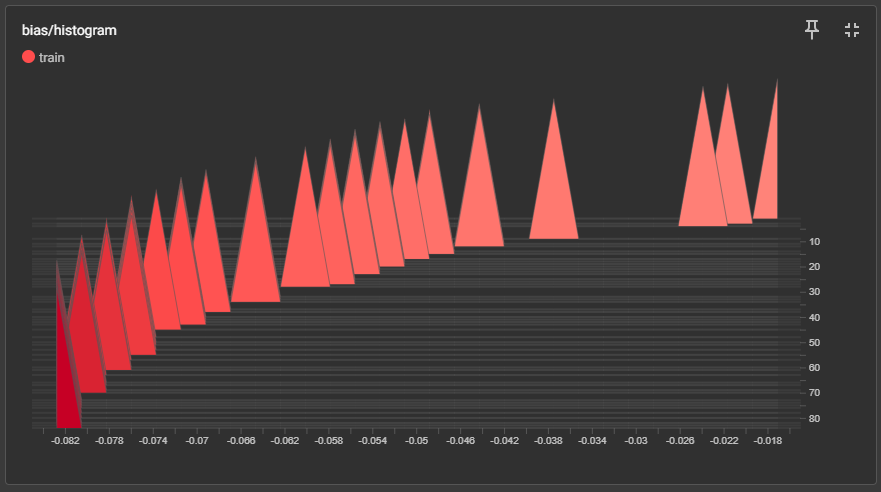
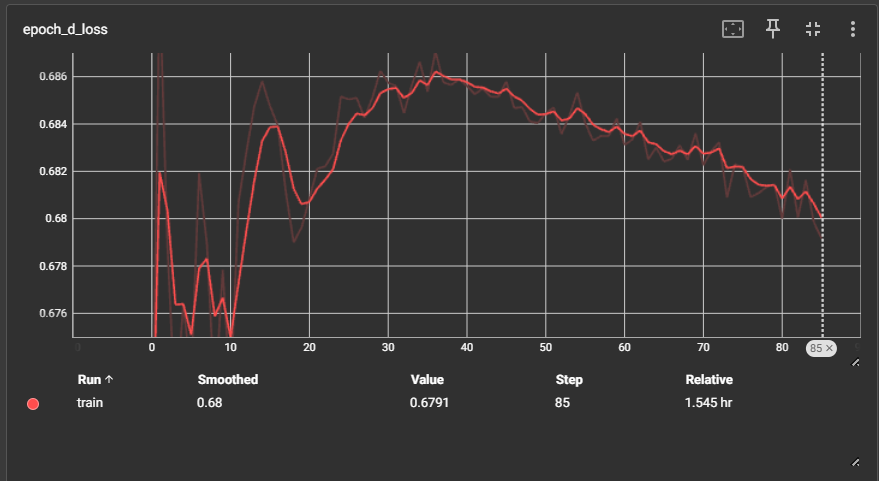
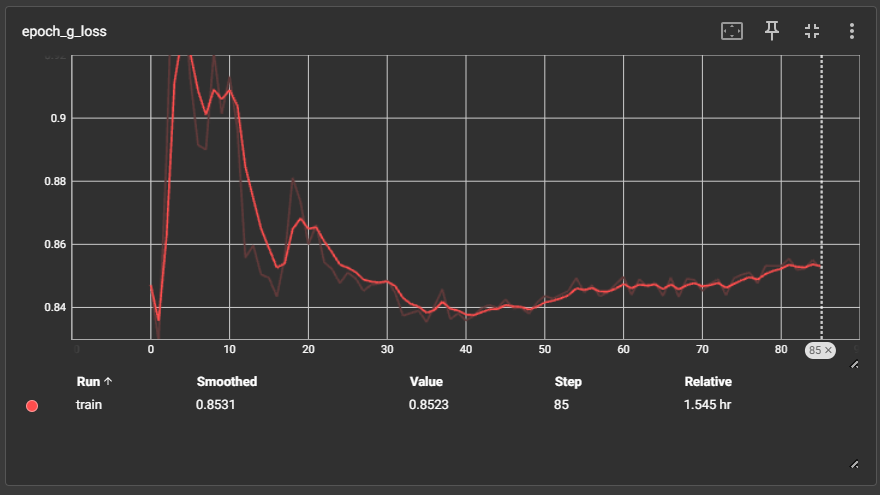
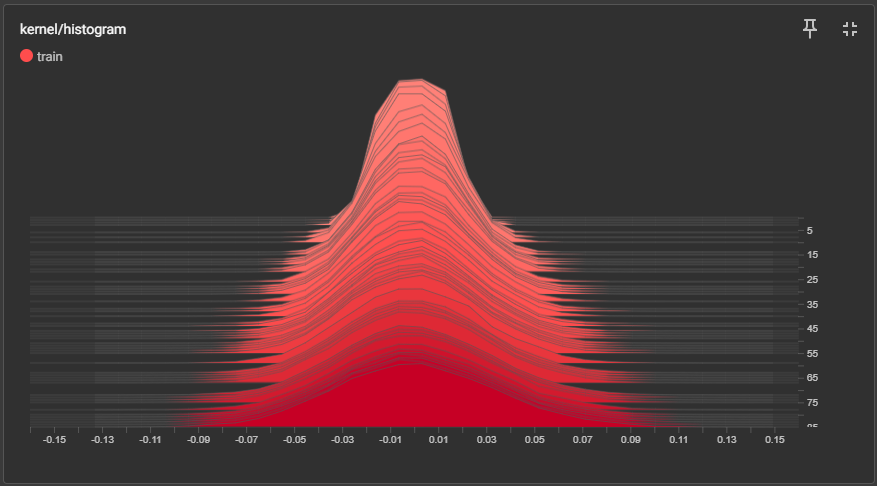

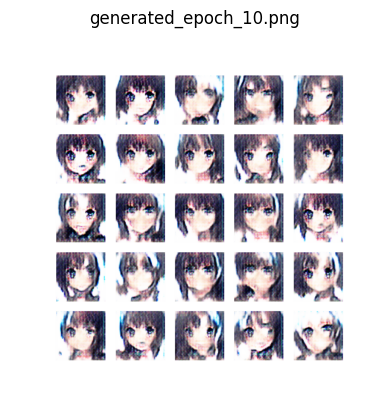

...

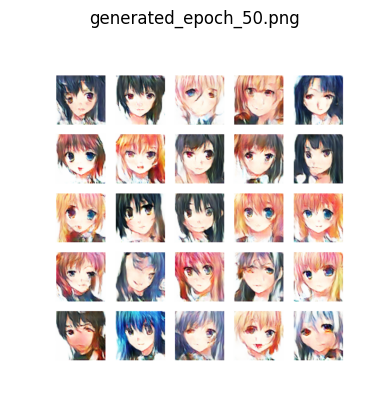

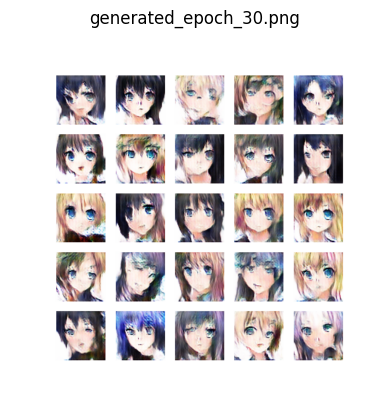

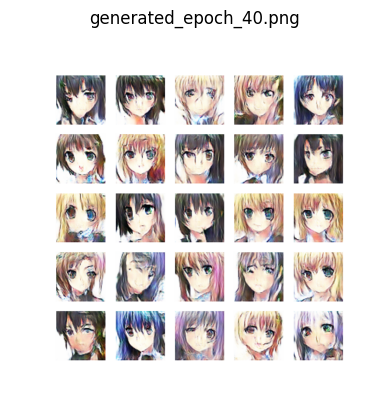

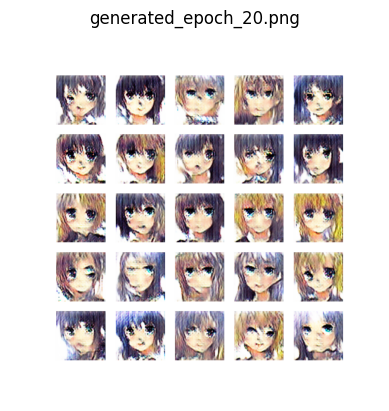

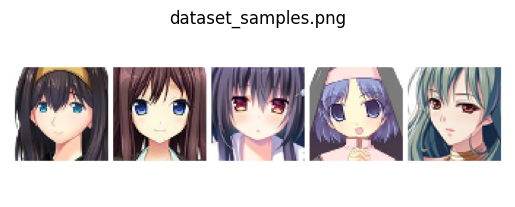

In [13]:
# prompt: display each image in generated images folder using matplotlib

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Directory containing generated images
image_dir = "./generated_images/"

# Iterate through the files in the directory
for filename in os.listdir(image_dir):
    if filename.endswith((".png", ".jpg", ".jpeg")):  # Check for image files
        img_path = os.path.join(image_dir, filename)
        img = mpimg.imread(img_path)
        plt.figure()  # Create a new figure for each image
        plt.imshow(img)
        plt.title(filename)  # Set the title to the filename
        plt.axis('off')  # Turn off axis ticks and labels
        plt.show()